**<h1> Pillow Library (PIL)</h1>**
<h2>Objectives</h2>
Image processing and computer vision tasks include displaying, cropping, flipping, rotating,  image segmentation, classification, image restoration,  image recognition, image generation.  Also, working with images via the cloud requires storing, transmitting, and gathering images through the internet. 

Python is an excellent choice as it has many image processing tools, computer vision and artificial intelligence libraries. Finally, it has many libraries for working with files in the cloud and on the internet.

A digital image is simply a file in your computer. In this lab, you will gain an understanding of these files and learn to work with these files with the Pillow Library (PIL).
<ul>
    <li><a href='#PIL'>Python Image Libraries </a>
        <ul>
            <li>Image Files and Paths  </li>
            <li>Load in Image in Python</li>
            <li>Plotting an Image </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
            <li> PIL Images into NumPy Arrays  </li>
        </ul>
    </li>
    
</ul>

Download the images for the lab:

!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png

!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png

!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png  


In [1]:
# First, let's define a helper function to concatenate two images side-by-side
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

## Image Files and Paths  
An image is stored as a file on your computer. Below, we define `my_image` as the filename of a file in this directory.


In [2]:
my_image = "lenna.png"

## Load Images in Python
Pillow (PIL) library is a popular library for loading images in Python. In addition, many other libraries such as "Keras" and "PyTorch" use this library to work with images. The `Image` module provides functions to load images from and saving images to the file system. Let's import it from `PIL`.


In [3]:
from PIL import Image

If the image is in the current working directory, we can load the image as follows using the image's filename and create a PIL Image object:


In [4]:
image = Image.open(my_image)
type(image)


PIL.PngImagePlugin.PngImageFile

If we are working in a Jupyter environment, we can view the image by calling the variable itself.  


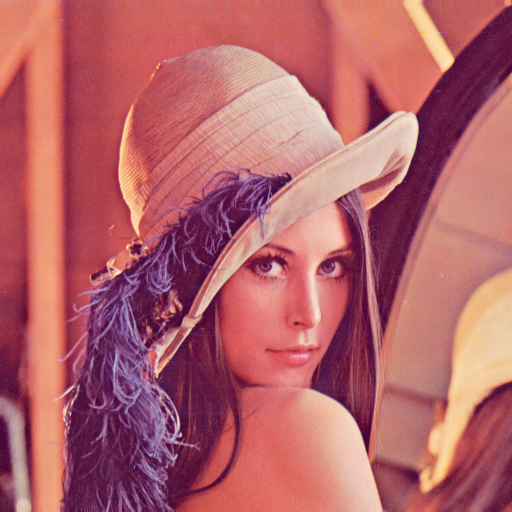

In [5]:
image

##  Plotting an Image 


In [6]:
image.show()

we can also use <code>imshow</code> method from the <code>matplotlib</code> library to display the image.


In [7]:
import matplotlib.pyplot as plt

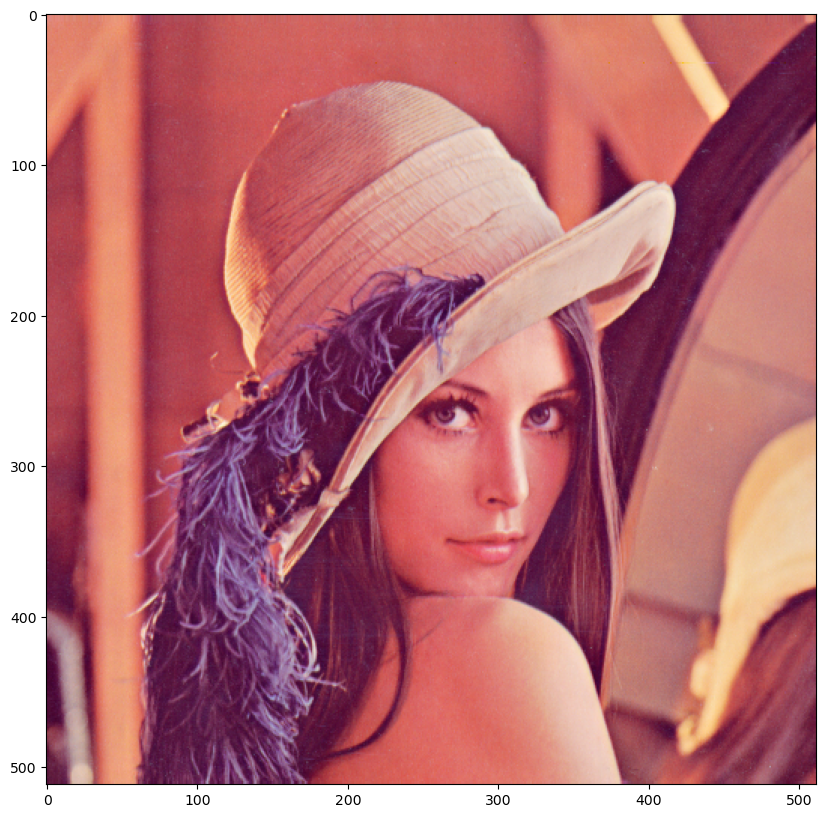

In [8]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

The attribute `size` returns a tuple, the first element is the number of pixels that comprise the width and the second element is the number of pixels that make up the height of the image.   


In [9]:
print(image.size)

(512, 512)


This is a string specifying the pixel format used. In this case, it's “RGB”. RGB is a color space where red, green, and blue are added together to produce other colors.

In [10]:
print(image.mode)

RGB


The `Image.open` method does not load image data into the computer memory. The `load` method of `PIL` object reads the file content, decodes it, and expands the image into memory.


In [11]:
im = image.load()

We can then check the intensity of the image at the $x$-th column and $y$-th row:


In [12]:
x = 0
y = 1
im[y,x]

(226, 137, 125)

We will use the array form to access the elements; it is slightly different.
we can save the image in `jpg` format using the following command.


In [13]:
image.save("lenna.jpg")

## Grayscale Images, Quantization and Color Channels  
The `ImageOps` module contains several ‘ready-made’ image processing operations. This module is somewhat experimental, and most operators only work with grayscale and/or RGB images.


In [14]:
from PIL import ImageOps

Grayscale images have pixel values representing the amount of light or intensity of that pixel. Light shades of gray have a high-intensity while darker shades have a lower intensity, i.e, white has the highest intensity and black the lowest.


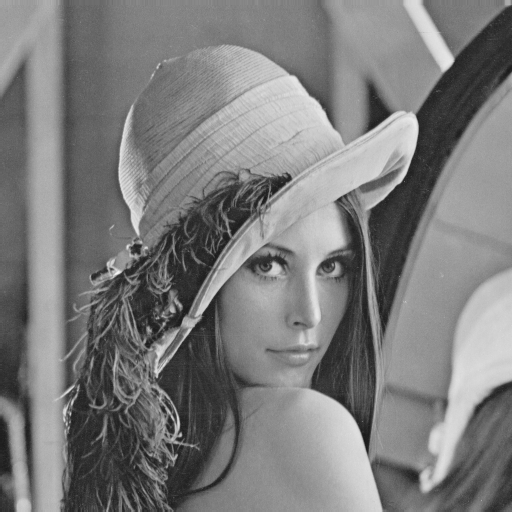

In [15]:
image_gray = ImageOps.grayscale(image)
image_gray

The mode is `L` for grayscale.


In [16]:
image_gray.mode

'L'

### Quantization
The Quantization of an image is the number of unique intensity values any given pixel of the image can take. For a grayscale image, this means the number of different shades of gray. Most images have 256 different levels. we can decrease the levels using the method `quantize`. Let's repeatably cut the number of levels in half and observe what happens:

Half the levels do not make a noticable difference.


In [19]:
image_gray.quantize(256 // 2)
image_gray.show()

Let’s continue dividing the number of values by two and compare it to the original image.


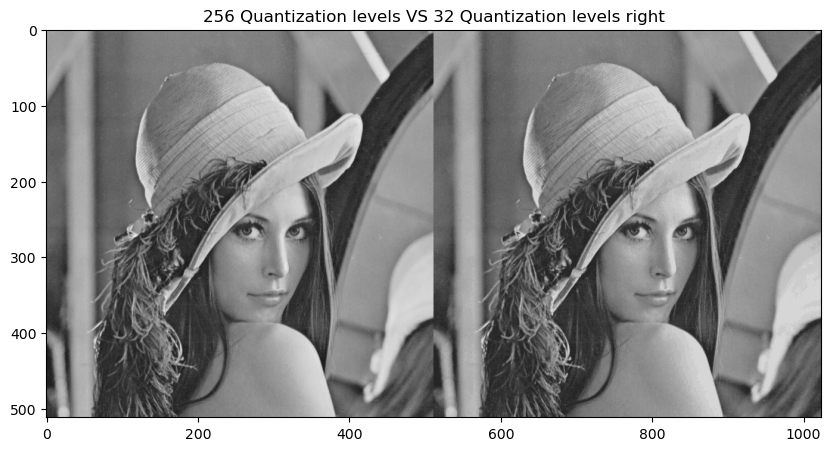

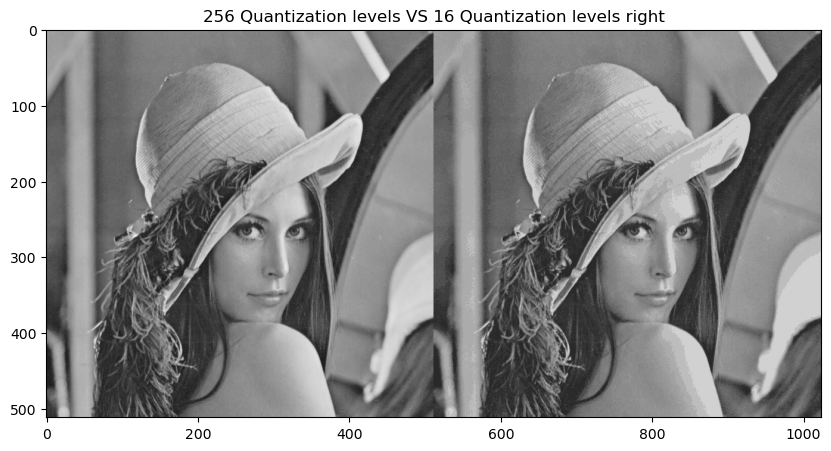

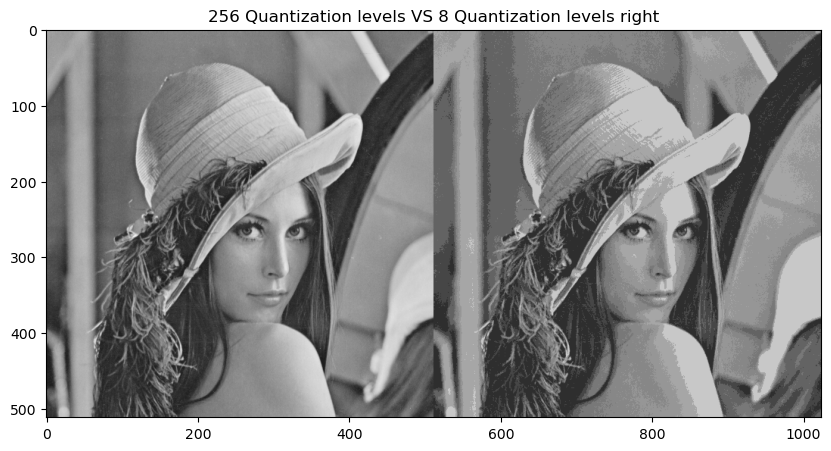

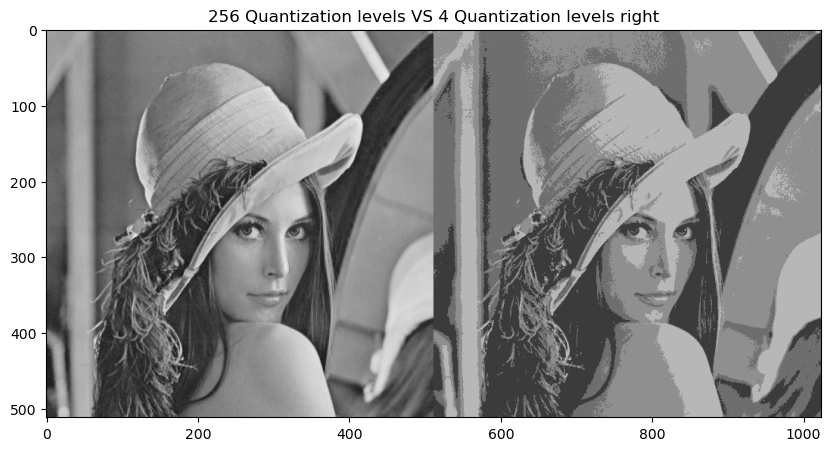

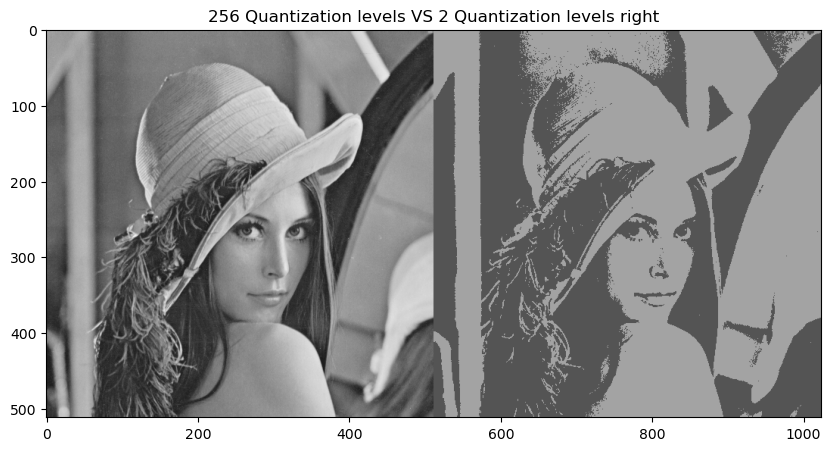

In [20]:
# get_concat_h(image_gray, image_gray.quantize(256//2)).show(title="Lena")

for n in range(3,8):
    plt.figure(figsize=(10,10))
    plt.imshow(get_concat_h(image_gray, image_gray.quantize(256 // 2**n)))
    plt.title("256 Quantization levels VS {} Quantization levels right". format(256 // 2**n))
    plt.show()


### Color Channels  
We can also work with the different color channels. Consider the following image:


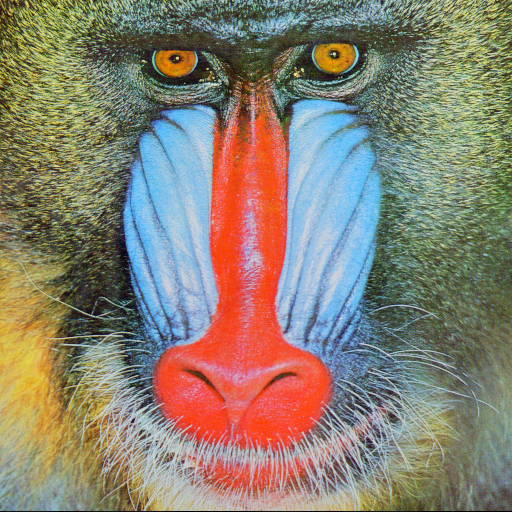

In [22]:
baboon = Image.open('baboon.png')
baboon

We can obtain the different RGB color channels and assign them to the variables <code>red</code>, <code>green</code>, and <code>blue</code>:


In [23]:
red, green, blue = baboon.split()

Plotting the color image next to the red channel as a grayscale, we see that regions with red have higher intensity values.


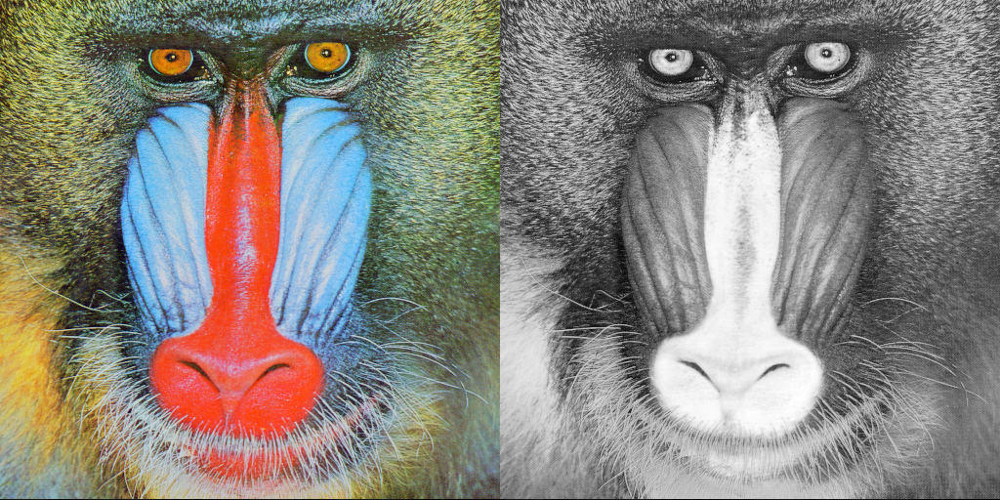

In [24]:
get_concat_h(baboon, red)

We can do the same for the blue and green channels:


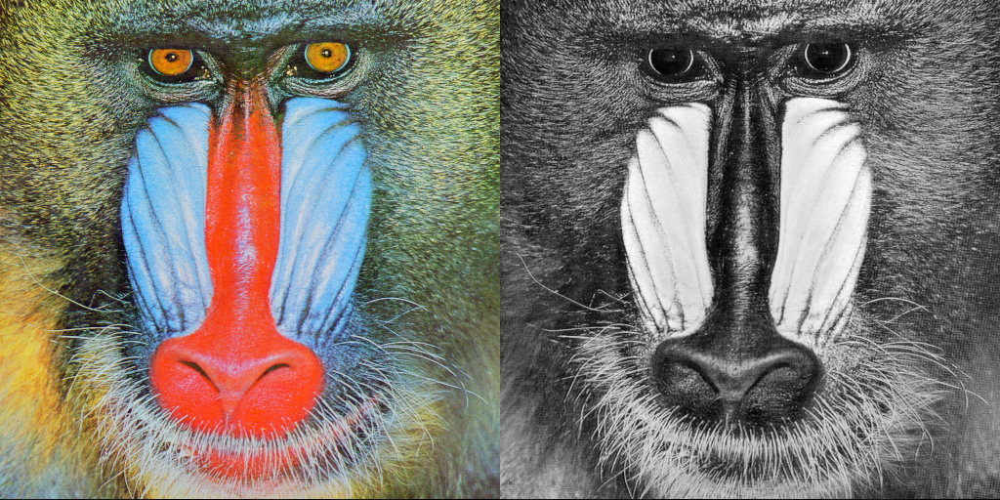

In [25]:
get_concat_h(baboon, blue)

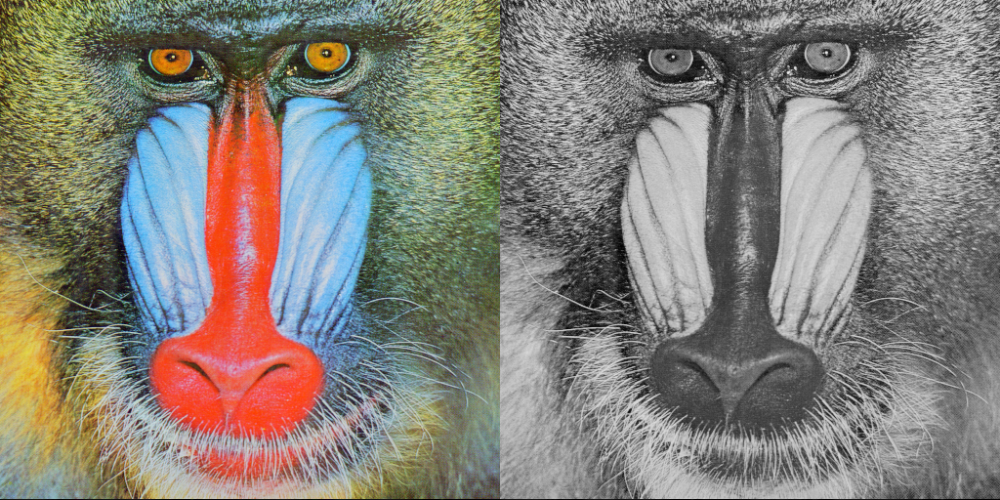

In [26]:
get_concat_h(baboon, green)